In [181]:
import os
import re
import time
import spotipy
import numpy as np
import pandas as pd
import altair as alt
import seaborn as sns
import umap.umap_ as umap
import plotly.express as px
import matplotlib.pyplot as plt

from tqdm import tqdm
from scipy.special import comb
from sklearn.manifold import MDS
from sklearn.manifold import TSNE
from sklearn.cluster import Birch
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS
from sklearn.decomposition import PCA

from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import AffinityPropagation
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from spotipy.oauth2 import SpotifyClientCredentials, SpotifyOAuth

import warnings
warnings.filterwarnings("ignore")

In [48]:
## Functions helping to count how many songs are there in the dataframe for each genre and 
## another one to balance data
def song_count(df):
    grouped_df = df.groupby('song_genre').count().reset_index()
    grouped_df
    totals = list(zip(grouped_df['song_genre'], grouped_df[grouped_df.columns[1]]))
    for genre, count in totals:
        print(genre,count)
    print('Total songs: {}'.format(len(df)))

def balance_data(df):
    grouped_df = df.groupby(['song_genre']).count()
    min_songs = min(grouped_df[grouped_df.columns[0]])
    min_genre = grouped_df[grouped_df.columns[0]][grouped_df[grouped_df.columns[0]] == min_songs].index.tolist()
    return df.groupby('song_genre').head(min_songs)

def rand_index_score(clusters, classes):
    tp_plus_fp = comb(np.bincount(clusters), 2).sum()
    tp_plus_fn = comb(np.bincount(classes), 2).sum()
    A = np.c_[(clusters, classes)]
    tp = sum(comb(np.bincount(A[A[:, 0] == i, 1]), 2).sum()
             for i in set(clusters))
    fp = tp_plus_fp - tp
    fn = tp_plus_fn - tp
    tn = comb(len(A), 2) - tp - fp - fn
    return (tp + tn) / (tp + fp + fn + tn)
    

In [4]:
# Documentation:
# Client credentials:
#   https://developer.spotify.com/documentation/general/guides/app-settings/#register-your-app
#
# What each audio features means:
#   https://developer.spotify.com/documentation/web-api/reference/#object-audiofeaturesobject
#   https://medium.com/@FinchMF/praise-questions-and-critique-spotify-api-38e984a4174b
# LUFS (Loudness):
#   https://www.sweetwater.com/insync/what-is-lufs-and-why-should-i-care/
# Scopes:
#   https://developer.spotify.com/documentation/general/guides/scopes/#user-library-read


# Examples:
#   https://www.researchgate.net/profile/Scott-Wolf/publication/342854806_Just_the_Way_You_Are_Linking_Music_Listening_on_Spotify_and_Personality/links/5f0bc62a92851c52d62f8a3a/Just-the-Way-You-Are-Linking-Music-Listening-on-Spotify-and-Personality.pdf
#   https://www.diva-portal.org/smash/get/diva2:1108465/FULLTEXT02
#   https://ieeexplore.ieee.org/abstract/document/7987199
#   https://www.math.vu.nl/~sbhulai/papers/paper-vandenhoven.pdf
#   https://towardsdatascience.com/discovering-your-music-taste-with-python-and-spotify-api-b51b0d2744d
#   https://towardsdatascience.com/a-music-taste-analysis-using-spotify-api-and-python-e52d186db5fc
#   https://rareloot.medium.com/extracting-spotify-data-on-your-favourite-artist-via-python-d58bc92a4330

# Cluster
# https://martinfleischmann.net/clustergam-visualisation-of-cluster-analysis/

In [5]:
  # acousticness: 0.0 to 1.0,   1 is acoustic

  # danceability: 0.0 to 1.0,   1 is most danceable

  # energy: 0.0 to 1.0, perceptual measure of intensity and activity. 1.0 energetic tracks feel fast, loud and noisy. 
  #     Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy.  
  
  # instrumentalness: 0.0 to 1.0, predicts whether a track contains no vocals (is instrumental).  1.0 is pure intrumental. Above 0.5 represent instrumental tracks.  
  
  # key:  Integers map to pitches using standard Pitch Class notation . E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on.    I still don't understand this :/

  # liveness: 0.0 to 1.0, presence of audience in the recording. 0.8 or above strong likelihood that the track is live.

  # loudness: -60.0 to 0.0db,  Negative number, closer to 0 is louder.

  # mode: 0 or 1, Minor=0 Major=1, Major is happier

  # speechiness: 0.0 to 1.0, detects presence of spoken words. 1.0 is talk show or audio book. 
  #     Values above 0.66 describe tracks that are probably made entirely of spoken words. 
  #     Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. 
  #     Values below 0.33 most likely represent music and other non-speech-like tracks.

  # tempo: BPM, Beats per minute 
  
  # valence: 0.0 to 1.0, describing musical positiveness, the higher the more positive. 
  
  # analysis_url: 
  # duration_ms: 238854,
  # id: '1eT2CjXwFXNx6oY5ydvzKU',
  # time_signature: 4,
  # track_href: 'https://api.spotify.com/v1/tracks/1eT2CjXwFXNx6oY5ydvzKU',
  # type: 'audio_features',
  # uri: 'spotify:track:1eT2CjXwFXNx6oY5ydvzKU',

In [6]:
## Load dataframe with all features
saved_songs_df = pd.read_csv('data/1000_songs_mfcc.csv').drop(columns=['Unnamed: 0'])

In [9]:
song_count(saved_songs_df)

blues 469
classical 380
country 812
electronic 477
heavy-metal 241
hip-hop 842
indie 628
k-pop 74
pop 849
punk 467
r-n-b 781
reggae 260
reggaeton 510
rock 806
salsa 574
Total songs: 8170


In [7]:
saved_songs_df.head()

,song_name,song_id,song_genre,url,artist,artist_id,artist_genre,release_date,duration_ms,popularity,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20
0,Come Back Baby,48al0wZBGItngZQZED80WO,blues,https://open.spotify.com/track/48al0wZBGItngZQ...,Ray Charles,1eYhYunlNJlDoQhtYBvPsi,"['adult standards', 'classic soul', 'jazz blue...",1957-01-01,186639,34,...,-11.700770,-6.954951,-3.231177,-5.142889,-6.540937,0.967129,-0.064558,-0.614783,-3.019311,-5.302307
1,Bad Luck,6qrnUwHfWubFB8tdvrAsby,blues,https://open.spotify.com/track/6qrnUwHfWubFB8t...,B.B. King,5xLSa7l4IV1gsQfhAMvl0U,"['blues', 'blues rock', 'classic rock', 'elect...",2008-08-18,174666,7,...,-7.517448,1.843155,-6.106958,1.077412,-6.505794,-1.329882,-5.179182,1.748319,-3.149593,2.127626
2,"Lenny - Live at The Spectrum, Montreal; Augusy...",5w8Ti9LEgtN2wXnJ4W4qpI,blues,https://open.spotify.com/track/5w8Ti9LEgtN2wXn...,Stevie Ray Vaughan,5fsDcuclIe8ZiBD5P787K1,"['album rock', 'blues', 'blues rock', 'classic...",1984,667200,25,...,11.367904,10.895202,-10.125711,-5.531595,-4.417445,8.245791,-10.501724,-2.382746,5.274812,4.494993
3,Badge,4a7Xu1edRTAGhjScmeGsUF,blues,https://open.spotify.com/track/4a7Xu1edRTAGhjS...,Cream,74oJ4qxwOZvX6oSsu1DGnw,"['album rock', 'art rock', 'blues rock', 'clas...",2005-01-01,165346,24,...,-2.589779,-0.184647,-7.040850,-1.954620,-8.156060,-1.024126,-8.376709,-8.534555,-12.192015,-0.181445
4,When My Train Pulls In,2mdxGlwrhtkuxgzbH7LOIh,blues,https://open.spotify.com/track/2mdxGlwrhtkuxgz...,Gary Clark Jr.,01aC2ikO4Xgb2LUpf9JfKp,"['blues rock', 'electric blues', 'funk', 'mode...",2012-10-22,465960,42,...,-4.626208,6.024627,-3.592650,-1.823680,-2.069260,4.833520,1.256663,-1.059293,-1.699642,6.252073


In [8]:
saved_songs_df.describe()

,duration_ms,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20
count,8.170000e+03,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,...,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000
mean,2.441135e+05,49.684945,0.594709,0.672011,5.302203,-7.371959,0.609180,0.093213,0.228688,0.085629,...,-2.644906,4.343548,-2.378289,2.525760,-2.809083,2.912103,-4.086439,2.762199,-2.778004,1.880856
std,9.447273e+04,18.694996,0.178450,0.222651,3.584505,4.640795,0.487964,0.089713,0.277462,0.231425,...,4.676288,4.486021,4.124607,4.153992,3.841739,3.850791,3.811244,3.562706,3.554713,3.715543
min,5.316800e+04,0.000000,0.000000,0.000049,0.000000,-43.804000,0.000000,0.000000,0.000000,0.000000,...,-24.624535,-24.624554,-22.618048,-19.793450,-19.773333,-17.240303,-22.720990,-18.623688,-19.138820,-13.757022
25%,1.992932e+05,38.000000,0.484250,0.543000,2.000000,-8.401500,0.000000,0.038100,0.014725,0.000000,...,-5.495921,1.785326,-4.978749,-0.016377,-5.246494,0.574976,-6.488360,0.604593,-5.058402,-0.438199
50%,2.275330e+05,52.000000,0.611000,0.709000,6.000000,-6.177000,1.000000,0.054650,0.103000,0.000007,...,-2.506659,4.541741,-2.422911,2.590768,-2.913925,2.943240,-4.208690,2.711996,-2.835734,1.799508
75%,2.680188e+05,64.000000,0.729000,0.846000,8.000000,-4.714000,1.000000,0.108000,0.360000,0.002610,...,0.236246,7.153013,0.107805,5.175290,-0.494888,5.314817,-1.774414,4.960707,-0.695912,4.182748
max,2.533813e+06,87.000000,0.973000,0.999000,11.000000,1.342000,1.000000,0.944000,0.996000,0.994000,...,19.933735,21.064558,22.623232,23.281860,25.246939,35.705376,39.115013,32.153690,19.617556,32.300976


In [10]:
radar_df = saved_songs_df[['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness',
                           'liveness', 'valence', 'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6',
                           'mfcc_7', 'mfcc_8', 'mfcc_9', 'mfcc_10', 'mfcc_11', 'mfcc_12', 'mfcc_13', 'mfcc_14', 
                           'mfcc_15', 'mfcc_16', 'mfcc_17', 'mfcc_18', 'mfcc_19', 'mfcc_20']]

In [11]:
radar_df.describe()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,mfcc_1,mfcc_2,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20
count,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,...,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000
mean,0.594709,0.672011,-7.371959,0.093213,0.228688,0.085629,0.188347,0.520312,-50.169646,88.325812,...,-2.644906,4.343548,-2.378289,2.525760,-2.809083,2.912103,-4.086439,2.762199,-2.778004,1.880856
std,0.178450,0.222651,4.640795,0.089713,0.277462,0.231425,0.152667,0.252308,75.600826,25.248739,...,4.676288,4.486021,4.124607,4.153992,3.841739,3.850791,3.811244,3.562706,3.554713,3.715543
min,0.000000,0.000049,-43.804000,0.000000,0.000000,0.000000,0.010700,0.000000,-690.239140,-14.330042,...,-24.624535,-24.624554,-22.618048,-19.793450,-19.773333,-17.240303,-22.720990,-18.623688,-19.138820,-13.757022
25%,0.484250,0.543000,-8.401500,0.038100,0.014725,0.000000,0.092900,0.321000,-77.741120,72.279898,...,-5.495921,1.785326,-4.978749,-0.016377,-5.246494,0.574976,-6.488360,0.604593,-5.058402,-0.438199
50%,0.611000,0.709000,-6.177000,0.054650,0.103000,0.000007,0.127500,0.526000,-38.672673,84.054057,...,-2.506659,4.541741,-2.422911,2.590768,-2.913925,2.943240,-4.208690,2.711996,-2.835734,1.799508
75%,0.729000,0.846000,-4.714000,0.108000,0.360000,0.002610,0.247000,0.726000,-1.557906,99.405362,...,0.236246,7.153013,0.107805,5.175290,-0.494888,5.314817,-1.774414,4.960707,-0.695912,4.182748
max,0.973000,0.999000,1.342000,0.944000,0.996000,0.994000,0.987000,0.982000,91.472440,228.106020,...,19.933735,21.064558,22.623232,23.281860,25.246939,35.705376,39.115013,32.153690,19.617556,32.300976


In [12]:
standard_scaler = StandardScaler()
radar_df['loudness'] = standard_scaler.fit_transform(radar_df['loudness'].to_numpy().reshape(-1, 1))
radar_df.describe()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,mfcc_1,mfcc_2,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20
count,8170.000000,8170.000000,8.170000e+03,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,...,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000,8170.000000
mean,0.594709,0.672011,-1.669819e-16,0.093213,0.228688,0.085629,0.188347,0.520312,-50.169646,88.325812,...,-2.644906,4.343548,-2.378289,2.525760,-2.809083,2.912103,-4.086439,2.762199,-2.778004,1.880856
std,0.178450,0.222651,1.000061e+00,0.089713,0.277462,0.231425,0.152667,0.252308,75.600826,25.248739,...,4.676288,4.486021,4.124607,4.153992,3.841739,3.850791,3.811244,3.562706,3.554713,3.715543
min,0.000000,0.000049,-7.850869e+00,0.000000,0.000000,0.000000,0.010700,0.000000,-690.239140,-14.330042,...,-24.624535,-24.624554,-22.618048,-19.793450,-19.773333,-17.240303,-22.720990,-18.623688,-19.138820,-13.757022
25%,0.484250,0.543000,-2.218595e-01,0.038100,0.014725,0.000000,0.092900,0.321000,-77.741120,72.279898,...,-5.495921,1.785326,-4.978749,-0.016377,-5.246494,0.574976,-6.488360,0.604593,-5.058402,-0.438199
50%,0.611000,0.709000,2.575058e-01,0.054650,0.103000,0.000007,0.127500,0.526000,-38.672673,84.054057,...,-2.506659,4.541741,-2.422911,2.590768,-2.913925,2.943240,-4.208690,2.711996,-2.835734,1.799508
75%,0.729000,0.846000,5.727729e-01,0.108000,0.360000,0.002610,0.247000,0.726000,-1.557906,99.405362,...,0.236246,7.153013,0.107805,5.175290,-0.494888,5.314817,-1.774414,4.960707,-0.695912,4.182748
max,0.973000,0.999000,1.877802e+00,0.944000,0.996000,0.994000,0.987000,0.982000,91.472440,228.106020,...,19.933735,21.064558,22.623232,23.281860,25.246939,35.705376,39.115013,32.153690,19.617556,32.300976


In [13]:
# convert column names into a list
categories=list(radar_df.columns)
# number of categories
N=len(categories)

# create a list with the average of all features
value=list(radar_df.mean())

In [14]:
fig = px.line_polar(radar_df, r=value, theta=categories, line_close=True, range_r=[-20,20])
fig.update_traces(fill='toself')
fig.show()

In [15]:
saved_songs_df.head()

,song_name,song_id,song_genre,url,artist,artist_id,artist_genre,release_date,duration_ms,popularity,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20
0,Come Back Baby,48al0wZBGItngZQZED80WO,blues,https://open.spotify.com/track/48al0wZBGItngZQ...,Ray Charles,1eYhYunlNJlDoQhtYBvPsi,"['adult standards', 'classic soul', 'jazz blue...",1957-01-01,186639,34,...,-11.700770,-6.954951,-3.231177,-5.142889,-6.540937,0.967129,-0.064558,-0.614783,-3.019311,-5.302307
1,Bad Luck,6qrnUwHfWubFB8tdvrAsby,blues,https://open.spotify.com/track/6qrnUwHfWubFB8t...,B.B. King,5xLSa7l4IV1gsQfhAMvl0U,"['blues', 'blues rock', 'classic rock', 'elect...",2008-08-18,174666,7,...,-7.517448,1.843155,-6.106958,1.077412,-6.505794,-1.329882,-5.179182,1.748319,-3.149593,2.127626
2,"Lenny - Live at The Spectrum, Montreal; Augusy...",5w8Ti9LEgtN2wXnJ4W4qpI,blues,https://open.spotify.com/track/5w8Ti9LEgtN2wXn...,Stevie Ray Vaughan,5fsDcuclIe8ZiBD5P787K1,"['album rock', 'blues', 'blues rock', 'classic...",1984,667200,25,...,11.367904,10.895202,-10.125711,-5.531595,-4.417445,8.245791,-10.501724,-2.382746,5.274812,4.494993
3,Badge,4a7Xu1edRTAGhjScmeGsUF,blues,https://open.spotify.com/track/4a7Xu1edRTAGhjS...,Cream,74oJ4qxwOZvX6oSsu1DGnw,"['album rock', 'art rock', 'blues rock', 'clas...",2005-01-01,165346,24,...,-2.589779,-0.184647,-7.040850,-1.954620,-8.156060,-1.024126,-8.376709,-8.534555,-12.192015,-0.181445
4,When My Train Pulls In,2mdxGlwrhtkuxgzbH7LOIh,blues,https://open.spotify.com/track/2mdxGlwrhtkuxgz...,Gary Clark Jr.,01aC2ikO4Xgb2LUpf9JfKp,"['blues rock', 'electric blues', 'funk', 'mode...",2012-10-22,465960,42,...,-4.626208,6.024627,-3.592650,-1.823680,-2.069260,4.833520,1.256663,-1.059293,-1.699642,6.252073


array([[<AxesSubplot:xlabel='duration_ms', ylabel='duration_ms'>,
        <AxesSubplot:xlabel='popularity', ylabel='duration_ms'>,
        <AxesSubplot:xlabel='danceability', ylabel='duration_ms'>, ...,
        <AxesSubplot:xlabel='mfcc_18', ylabel='duration_ms'>,
        <AxesSubplot:xlabel='mfcc_19', ylabel='duration_ms'>,
        <AxesSubplot:xlabel='mfcc_20', ylabel='duration_ms'>],
       [<AxesSubplot:xlabel='duration_ms', ylabel='popularity'>,
        <AxesSubplot:xlabel='popularity', ylabel='popularity'>,
        <AxesSubplot:xlabel='danceability', ylabel='popularity'>, ...,
        <AxesSubplot:xlabel='mfcc_18', ylabel='popularity'>,
        <AxesSubplot:xlabel='mfcc_19', ylabel='popularity'>,
        <AxesSubplot:xlabel='mfcc_20', ylabel='popularity'>],
       [<AxesSubplot:xlabel='duration_ms', ylabel='danceability'>,
        <AxesSubplot:xlabel='popularity', ylabel='danceability'>,
        <AxesSubplot:xlabel='danceability', ylabel='danceability'>, ...,
        <AxesSubplot

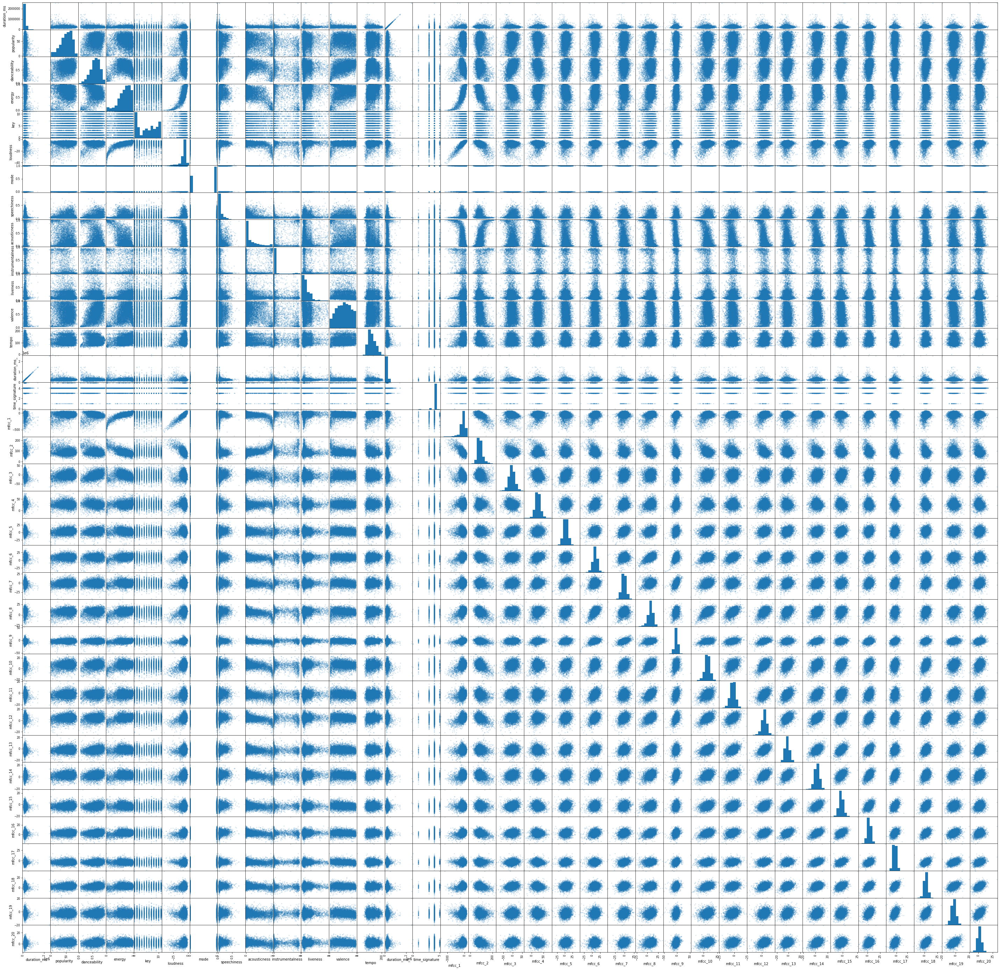

In [16]:
pd.plotting.scatter_matrix(saved_songs_df, alpha=0.2, figsize=(50,50))


In [17]:
# Creating the df with columns of interest
feature_names = ['danceability','energy','key','loudness','mode','speechiness','acousticness',
                      'instrumentalness','liveness','valence','tempo', 'duration_ms','time_signature', 
                      'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8',
                      'mfcc_9', 'mfcc_10', 'mfcc_11', 'mfcc_12', 'mfcc_13', 'mfcc_14', 'mfcc_15', 'mfcc_16', 
                      'mfcc_17', 'mfcc_18', 'mfcc_19', 'mfcc_20']
df = saved_songs_df[feature_names]
df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20
0,0.584,0.110,3,-12.535,1,0.0376,0.90700,0.000003,0.1130,0.369,...,-11.700770,-6.954951,-3.231177,-5.142889,-6.540937,0.967129,-0.064558,-0.614783,-3.019311,-5.302307
1,0.644,0.537,2,-5.768,1,0.0763,0.82900,0.000000,0.3610,0.793,...,-7.517448,1.843155,-6.106958,1.077412,-6.505794,-1.329882,-5.179182,1.748319,-3.149593,2.127626
2,0.351,0.311,8,-13.927,1,0.0345,0.31900,0.126000,0.3130,0.221,...,11.367904,10.895202,-10.125711,-5.531595,-4.417445,8.245791,-10.501724,-2.382746,5.274812,4.494993
3,0.594,0.678,7,-11.415,1,0.0397,0.44900,0.000149,0.0833,0.730,...,-2.589779,-0.184647,-7.040850,-1.954620,-8.156060,-1.024126,-8.376709,-8.534555,-12.192015,-0.181445
4,0.285,0.979,11,-2.262,0,0.1290,0.00405,0.061000,0.2670,0.323,...,-4.626208,6.024627,-3.592650,-1.823680,-2.069260,4.833520,1.256663,-1.059293,-1.699642,6.252073


In [18]:
# Scale all features
StdScaler = StandardScaler().fit_transform(df)

In [19]:
# Running PCA on the scaled features
pca = PCA(n_components = 5, random_state = 0).fit(StdScaler)

In [20]:
# Calculating variance for each principal component
singularValues = pca.singular_values_
variance = np.square(singularValues)/(len(StdScaler)-1)
variance

array([7.42899521, 3.5891226 , 2.34520377, 1.64301877, 1.28934535])

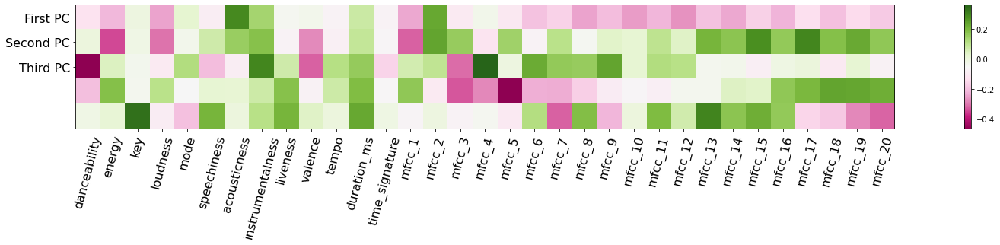

In [21]:
def plot_pca_heatmap(pca, feature_names):
    pc_names = ['First PC', 'Second PC', 'Third PC']
    fig, ax = plt.subplots(figsize=(len(feature_names), 3))
    plt.imshow(pca.components_, interpolation = 'none', cmap = 'PiYG')
    feature_names=list(feature_names)
    plt.xticks(np.arange(0, len(feature_names), 1) , feature_names[:], rotation = 75, fontsize=16)
    plt.yticks(np.arange(0.0, 3, 1), pc_names, fontsize = 16)
    plt.colorbar()



plot_pca_heatmap(pca, feature_names)

<Figure size 432x288 with 0 Axes>

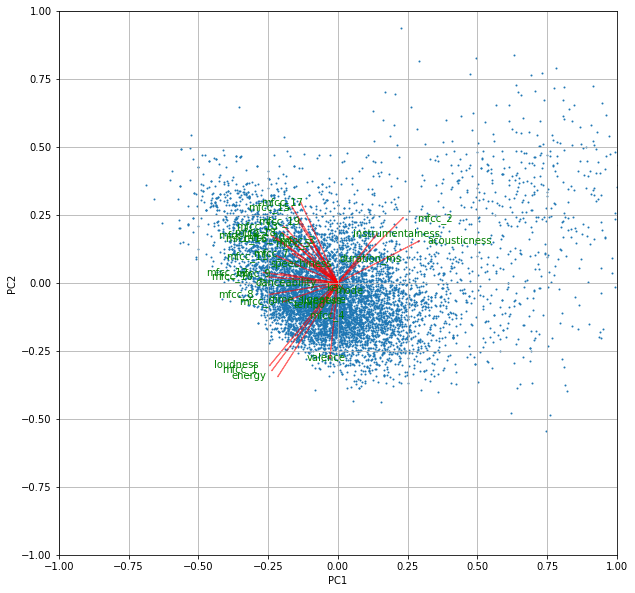

In [22]:
def biplot(score, coeff, maxdim, pcax, pcay, labels=None):
    pca1=pcax-1
    pca2=pcay-1
    xs = score[:,pca1]
    ys = score[:,pca2]
    n = min(coeff.shape[0], maxdim)
    scalex = 2.0/(xs.max()- xs.min())
    scaley = 2.0/(ys.max()- ys.min())
    text_scale_factor = 1.5
    plt.scatter(xs*scalex, ys*scaley, s=1)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,pca1], coeff[i,pca2],color='r',alpha=0.5) 
        if labels is None:
            plt.text(coeff[i,pca1]* text_scale_factor, coeff[i,pca2] * text_scale_factor, "Var"+str(i+1), color='g', ha='center', va='center')
        else:
            plt.text(coeff[i,pca1]* text_scale_factor, coeff[i,pca2], labels[i], color='g', ha='center', va='center')
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.xlabel("PC{}".format(pcax))
    plt.ylabel("PC{}".format(pcay))
    plt.grid()

plt.figure()
plt.figure(figsize=(10, 10))

# Uncomment this code to generate the biplot using your previous answers
X_normalized = StdScaler
X_pca = pca.transform(X_normalized)
biplot(X_pca, np.transpose(pca.components_[0:2, :]), len(feature_names), 1, 2, labels=feature_names[:])

In [23]:
print('iniciando')
X_pca = PCA(n_components = 2).fit_transform(StdScaler)
print('PCA Done')
X_tsne = TSNE(n_components = 2, random_state = 42).fit_transform(StdScaler)
print('T-SNE Done')
# X_mds = MDS(n_components = 2, random_state = 42).fit_transform(StdScaler)
print('MDS Done')

iniciando
PCA Done
T-SNE Done
MDS Done


NameError: name 'X_mds' is not defined

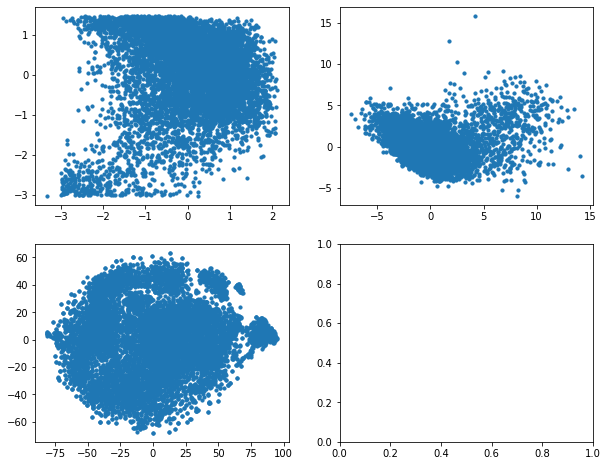

In [180]:
fig, axes = plt.subplots(2, 2, figsize=(10, 8))


axes[0, 0].scatter(StdScaler[:, 0], StdScaler[:, 1], s=10)
axes[0, 1].scatter(X_pca[:, 0], X_pca[:, 1], s=10)
axes[1, 0].scatter(X_tsne[:, 0], X_tsne[:, 1], s=10)
# axes[1, 1].scatter(X_mds[:, 0], X_mds[:, 1], s=10)

axes[0, 0].set_title("Original")
axes[0, 1].set_title("PCA")
axes[1, 0].set_title("t-SNE")
# axes[1, 1].set_title("MDS")
del fig, axes

In [25]:
# # get index from songs given X and Y coordinates on t-SNE
# songs_index = (np.where((X_tsne[:,0] <= -20) & (X_tsne[:,1] >= 15)))
# saved_songs_df.iloc[songs_index]

In [26]:
df[feature_names] = StandardScaler().fit_transform(df[feature_names])
df

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20
0,-0.060016,-2.524330,-0.642305,-1.112602,0.800969,-0.619939,2.444856,-0.370019,-0.493565,-0.599749,...,-1.936668,-2.518756,-0.206793,-1.846204,-0.971456,-0.505115,1.055332,-0.947928,-0.067888,-1.933392
1,0.276233,-0.606417,-0.921300,0.345643,0.800969,-0.188539,2.163719,-0.370031,1.130980,1.080841,...,-1.042032,-0.557408,-0.904061,-0.348686,-0.962308,-1.101655,-0.286733,-0.284599,-0.104541,0.066420
2,-1.365783,-1.621518,0.752673,-1.412569,0.800969,-0.654496,0.325514,0.174456,0.816552,-1.186370,...,2.996751,1.460549,-1.878457,-1.939784,-0.418680,1.385174,-1.683355,-1.444200,2.265530,0.703611
3,-0.003975,0.026899,0.473678,-0.871249,0.800969,-0.596530,0.794076,-0.369387,-0.688118,0.831130,...,0.011789,-1.009463,-1.130495,-1.078638,-1.391897,-1.022250,-1.125756,-3.171029,-2.648480,-0.555081
4,-1.735656,1.378871,1.589660,1.101163,-1.248488,0.398924,-0.809668,-0.106430,0.515225,-0.782077,...,-0.423717,0.374760,-0.294437,-1.047115,0.192587,0.498997,1.402017,-1.072703,0.303380,1.176540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8165,-0.233745,1.167766,1.031669,0.579453,-1.248488,0.320893,0.729198,-0.370031,3.692260,0.601238,...,-0.196810,0.311132,-0.707319,0.052321,-0.065332,-0.321994,-0.354446,-1.096806,-1.368592,0.157346
8166,0.360295,0.696148,-0.084313,0.258152,-1.248488,-0.595415,1.489710,-0.369994,1.261992,1.611971,...,-0.940238,-1.727167,-0.336165,-1.113742,-0.061588,-0.217696,-1.964886,-0.439373,-0.253620,-0.871449
8167,-0.984701,-0.799555,-0.363309,0.018524,-1.248488,-0.561973,1.320307,-0.370031,0.351460,-0.900987,...,-0.254786,-0.374912,-0.801237,-0.317511,-0.216771,-0.368083,-0.628582,0.456587,-0.090612,0.676617
8168,1.172896,-0.503110,-1.200296,0.099118,-1.248488,-0.596530,0.675133,-0.370031,-0.835506,0.981749,...,-2.916890,-0.412493,-1.604946,-2.743363,-1.544690,-0.907258,-0.435906,1.973622,0.658427,0.513028


In [95]:
# Apply PCA to scaled data and create df

df_pca = pd.DataFrame(PCA(n_components = 2).fit_transform(StdScaler),columns=['PC1','PC2']) 
df_pca.head()

,PC1,PC2
0,6.291763,1.385970
1,3.282621,-1.490701
2,1.249335,1.107792
3,4.288806,-2.934235
4,-0.758370,-1.376639


In [96]:
df_tsne = pd.DataFrame(TSNE(n_components = 2).fit_transform(StdScaler),columns=['X','Y']) 
df_tsne.head()

,X,Y
0,58.935001,-31.594379
1,31.546993,-47.528919
2,-22.974529,-12.221138
3,21.889107,-43.197556
4,-44.282177,1.671118


<AxesSubplot:xlabel='PC1', ylabel='PC2'>

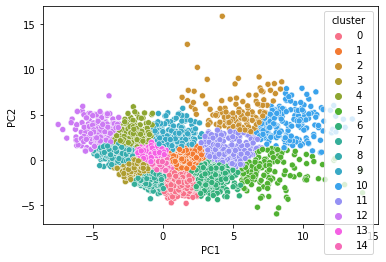

In [74]:
# Apply KMeans cluster on the 2 Principal Component PCA and visualize clusters on clustered PCA

kmeans = KMeans(n_clusters=15, random_state=0).fit(X_pca)
# cluster = pd.DataFrame(X_pca,columns=['x','y'])
df_pca['cluster'] = pd.Categorical(kmeans.labels_)

sns.scatterplot(x="PC1",y="PC2",hue="cluster",data=df_pca)


#Kmeans might not be the best due to not clear separation after PCA

In [77]:
# Create df with actual genre for each row and predicted cluster based on Kmeans
df_cluster = pd.concat([df_pca, saved_songs_df[['song_genre']]], axis=1)
df_cluster.head()

,PC1,PC2,cluster,song_genre
0,6.291763,1.385985,11,blues
1,3.282621,-1.490747,6,blues
2,1.249335,1.107819,1,blues
3,4.288806,-2.934274,6,blues
4,-0.758370,-1.376668,7,blues


In [78]:
# Select a genre from the ground truth label and see how many clusteres were predicted with those songs
df_cluster['cluster'] = kmeans.labels_
print('Total songs {}'.format(len(df_cluster[df_cluster['song_genre']=='blues'])))
df_cluster[df_cluster['song_genre']=='blues'][['song_genre', 'cluster']].groupby(['cluster']).count().sort_values('song_genre', ascending=False)


Total songs 469


,song_genre
cluster,
1,83
0,71
6,65
14,63
11,44
5,33
13,30
9,29
7,26


In [79]:
# Explore how many songs fell on each genre
df_cluster['cluster'] = kmeans.labels_
df_cluster[df_cluster['cluster']==7][['song_genre', 'cluster']].groupby(['song_genre']).count().sort_values('cluster', ascending=False)

,cluster
song_genre,
punk,199
rock,199
country,112
reggaeton,58
heavy-metal,42
indie,42
salsa,35
blues,26
hip-hop,23


<AxesSubplot:xlabel='PC1', ylabel='PC2'>

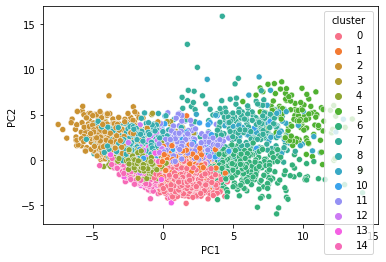

In [80]:
# Apply KMeans cluster on the scaled data itself and then PCA to visualize

kmeans = KMeans(n_clusters=15, random_state=0).fit(df)
# cluster = pd.DataFrame(X_pca,columns=['x','y'])
df_pca['cluster'] = pd.Categorical(kmeans.labels_)

sns.scatterplot(x="PC1",y="PC2",hue="cluster",data=df_pca)


#Kmeans might not be the best due to not clear separation after PCA

In [81]:
# Create df with actual genre for each row and predicted cluster based on Kmeans
df_cluster = pd.concat([df_pca, saved_songs_df[['song_genre']]], axis=1)
df_cluster.head()

,PC1,PC2,cluster,song_genre
0,6.291763,1.385985,6,blues
1,3.282621,-1.490747,0,blues
2,1.249335,1.107819,11,blues
3,4.288806,-2.934274,6,blues
4,-0.758370,-1.376668,14,blues


In [82]:
# Select a genre from the ground truth label and see how many clusteres were predicted with those songs
df_cluster['cluster'] = kmeans.labels_
print('Total songs {}'.format(len(df_cluster[df_cluster['song_genre']=='blues'])))
df_cluster[df_cluster['song_genre']=='blues'][['song_genre', 'cluster']].groupby(['cluster']).count().sort_values('song_genre', ascending=False)



Total songs 469


,song_genre
cluster,
0,88
11,80
6,74
10,66
13,50
14,36
4,35
3,22
1,7


In [84]:
# Explore how many songs fell on given predicted cluster
df_cluster['cluster'] = kmeans.labels_
df_cluster[df_cluster['cluster']==7][['song_genre', 'cluster']].groupby(['song_genre']).count().sort_values('cluster', ascending=False)

,cluster
song_genre,
classical,182
electronic,10
blues,5
indie,5


<AxesSubplot:xlabel='PC1', ylabel='PC2'>

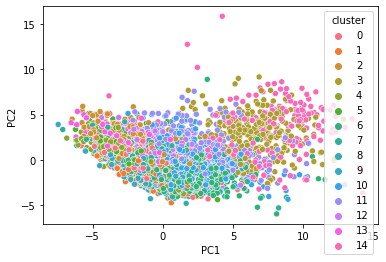

In [90]:
# Apply KMeans cluster on the scaled data itself with only certain attributes and then PCA to visualize

kmeans = KMeans(n_clusters=15, random_state=0).fit(df[['acousticness', 'energy', 'danceability', 'mfcc_4', 'mfcc_5', 'key']])
# cluster = pd.DataFrame(X_pca,columns=['x','y'])
df_pca['cluster'] = pd.Categorical(kmeans.labels_)

sns.scatterplot(x="PC1",y="PC2",hue="cluster",data=df_pca)


#Kmeans might not be the best due to not clear separation after PCA

In [156]:
df.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms', 'time_signature', 'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4',
       'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8', 'mfcc_9', 'mfcc_10', 'mfcc_11',
       'mfcc_12', 'mfcc_13', 'mfcc_14', 'mfcc_15', 'mfcc_16', 'mfcc_17',
       'mfcc_18', 'mfcc_19', 'mfcc_20'],
      dtype='object')

<AxesSubplot:xlabel='X', ylabel='Y'>

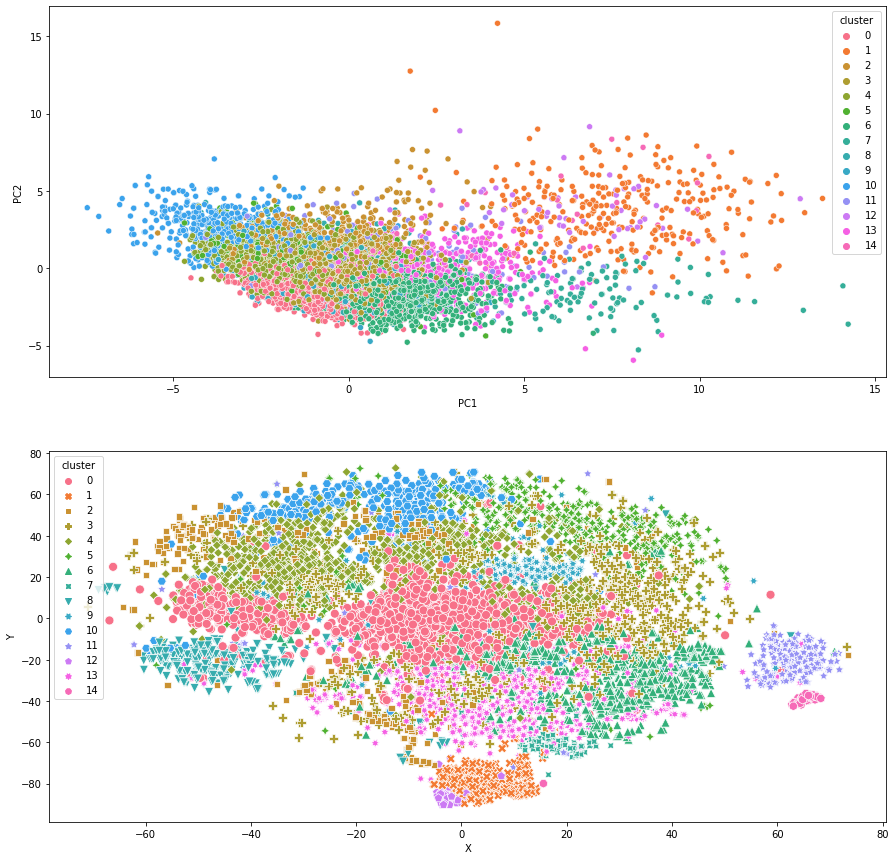

In [185]:
# Apply Aglomerative cluster on the scaled data itself and then PCA to visualize

clustering = AgglomerativeClustering(n_clusters=15, linkage='ward').fit(df)
# cluster = pd.DataFrame(X_pca,columns=['x','y'])
df_pca['cluster'] = pd.Categorical(clustering.labels_)
df_tsne['cluster'] = pd.Categorical(clustering.labels_)

fig, axs = plt.subplots(nrows=2, figsize=(15,15))
sns.scatterplot(x="PC1", y="PC2", hue="cluster", data=df_pca, ax=axs[0])
sns.scatterplot(x="X", y="Y", hue="cluster", style="cluster", data=df_tsne, ax=axs[1], s=80)



#Kmeans might not be the best due to not clear separation after PCA

In [191]:
# Explore how many songs fell on given predicted cluster
df_cluster['cluster'] = clustering.labels_
df_cluster[df_cluster['cluster']==11][['song_genre', 'cluster']].groupby(['song_genre']).count().sort_values('cluster', ascending=False)

,cluster
song_genre,
blues,75
country,35
rock,35
r-n-b,28
heavy-metal,24
indie,22
punk,13
electronic,12
pop,10


In [154]:
# Select a genre from the ground truth label and see how many clusteres were predicted with those songs
genre = 'classical'
df_cluster['cluster'] = clustering.labels_
print('Total songs {}'.format(len(df_cluster[df_cluster['song_genre']==genre])))
df_cluster[df_cluster['song_genre']==genre][['song_genre', 'cluster']].groupby(['cluster']).count().sort_values('song_genre', ascending=False)

Total songs 380


,song_genre
cluster,
1,289
12,56
14,12
13,8
2,7
11,4
7,3
10,1


In [187]:
# Create df with actual genre for each row and predicted cluster based on Kmeans
df_cluster = pd.concat([df_pca, saved_songs_df[['song_genre']]], axis=1)
df_cluster.head()

,PC1,PC2,cluster,song_genre
0,6.291763,1.385970,11,blues
1,3.282621,-1.490701,13,blues
2,1.249335,1.107792,2,blues
3,4.288806,-2.934235,7,blues
4,-0.758370,-1.376639,0,blues


<AxesSubplot:xlabel='X', ylabel='Y'>

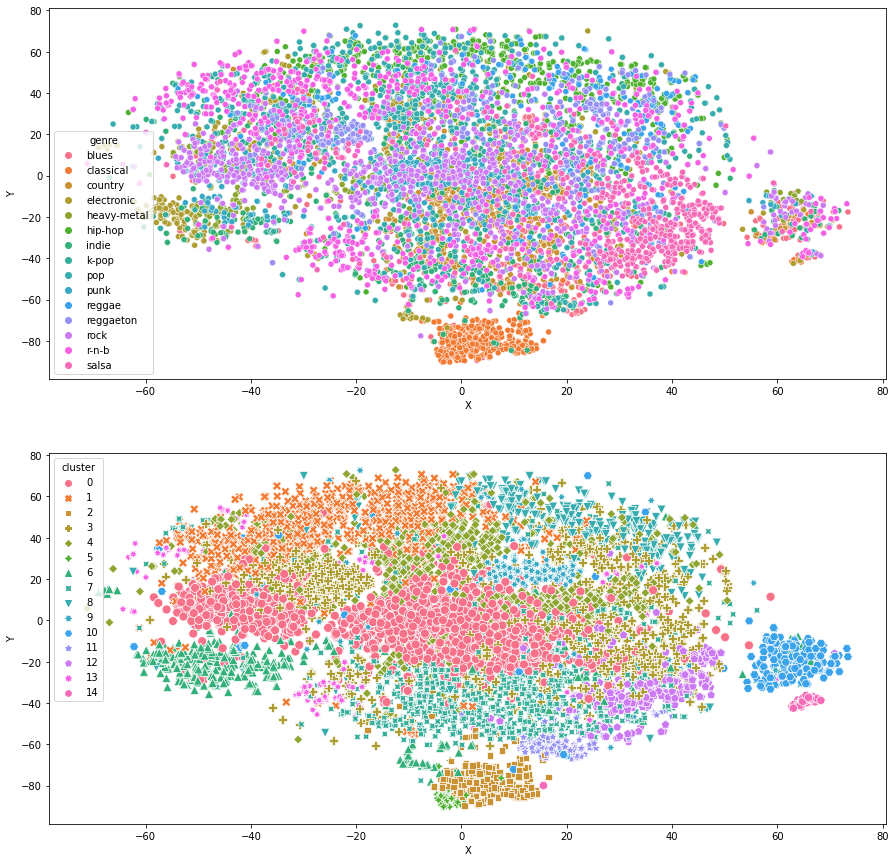

In [184]:
# Apply DBSCAN on the scaled data itself and then TSNE to visualize

clustering = Birch(n_clusters=15).fit(df)
# cluster = pd.DataFrame(X_pca,columns=['x','y'])
df_pca['cluster'] = pd.Categorical(clustering.labels_)
df_tsne['cluster'] = pd.Categorical(clustering.labels_)
df_tsne['genre'] = saved_songs_df[['song_genre']]


fig, axs = plt.subplots(nrows=2, figsize=(15,15))
sns.scatterplot(x="X", y="Y", hue="genre", data=df_tsne, ax=axs[0])
sns.scatterplot(x="X", y="Y", hue="cluster", style="cluster", data=df_tsne, ax=axs[1], s=80)


#Kmeans might not be the best due to not clear separation after PCA

In [83]:
#With new method
tsne = TSNE(n_components=3, verbose=1, perplexity=80, n_iter=5000, learning_rate=200)
tsne_scale_results = tsne.fit_transform(df)

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 8170 samples in 0.001s...


KeyboardInterrupt: 

In [ ]:
tsne_df_scale = pd.DataFrame(tsne_scale_results, columns=['tsne1', 'tsne2', 'tsne3'])

In [ ]:
kmeans_tsne_scale = KMeans(n_clusters=15, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(tsne_df_scale)
# print('KMeans tSNE Scaled Silhouette Score: {}'.format(silhouette_score(tsne_df_scale, kmeans_tsne_scale.labels_, metric='euclidean')))
# davies = davies_bouldin_score(tsne_df_scale, kmeans_tsne_scale.labels_)
# calinski = metrics.calinski_harabasz_score(tsne_df_scale, kmeans_tsne_scale.labels_)
# print("For K = {}:\n\tDavies Boudin Score = {}\n\tCalinski Harabasz Score = {}".format(11, davies, calinski))
labels_tsne_scale = kmeans_tsne_scale.labels_
clusters_tsne_scale = pd.concat([tsne_df_scale, pd.DataFrame({'tsne_clusters':labels_tsne_scale})], axis=1)

In [ ]:
plt.figure(figsize = (10,10))
sns.scatterplot(clusters_tsne_scale.iloc[:,0],clusters_tsne_scale.iloc[:,1],hue=labels_tsne_scale, palette='Set1', s=100, alpha=0.6).set_title('K-Means Clusters (11) via t-SNE', fontsize=15)
plt.legend()
plt.show()

In [ ]:
df_cluster['cluster'] = labels_tsne_scale
print('Total songs {}'.format(len(df_cluster[df_cluster['song_genre']=='classical'])))
df_cluster[df_cluster['song_genre']=='classical'][['song_genre', 'cluster']].groupby(['cluster']).count().sort_values('song_genre', ascending=False)

In [ ]:
df_cluster['cluster'] = labels_tsne_scale
df_cluster[df_cluster['cluster']==0][['song_genre', 'cluster']].groupby(['song_genre']).count().sort_values('cluster', ascending=False)

In [ ]:
df_cluster = pd.concat([saved_songs_df, cluster], axis=1)
df_cluster[['song_genre', 'cluster']]

# Scrap songs from different genres

In [ ]:
# Define list of genres to look to build a dataset
genres = ['blues', 'classical', 'country', 'electronic', 'heavy-metal', 'hip-hop', 'indie', 'k-pop', 'pop',
               'punk', 'reggae', 'reggaeton', 'rock', 'r-n-b', 'salsa']

# genres = ['alt-rock', 'alternative', 'blues', 'classical', 'country', 'dance', 'electronic', 'folk', 'heavy-metal',
#           'hip-hop', 'indie', 'indie-pop', 'k-pop', 'punk','punk-rock', 'reggae', 'reggaeton','r-n-b']

In [ ]:
def get_songs(genres, num_songs):
    """
    Input: list of genres to extract
    Output: DataFrame with songs for each different genre
    """
    
    song_name = []
    song_id = []
    song_genre = []
    artist = []
    artist_id = []
    artist_genre = []
    release_date = []
    duration_ms = []
    popularity = []
    danceability = []
    energy = []
    key = []
    loudness = []
    mode = []
    speechiness = []
    acousticness = []
    instrumentalness = []
    liveness = []
    valence = []
    tempo = []
    duration_ms_ = []
    time_signature = []
    url = []
    
    iterations = 0
    for genre in genres:
        while len(song_id) < num_songs:
            if len(song_id) % 50 == 0: 
                print('iteration: {}, total songs: {}'.format(iterations, len(song_id)))
                df = pd.DataFrame({'song_name':song_name, 'song_id':song_id, 'song_genre':song_genre, 'url':url,
                                   'artist':artist, 'artist_id':artist_id, 'artist_genre':artist_genre, 
                                   'release_date':release_date,'duration_ms':duration_ms, 'popularity':popularity, 
                                   'danceability':danceability, 'energy':energy,'key':key, 'loudness':loudness, 
                                   'mode':mode, 'speechiness':speechiness, 'acousticness':acousticness,
                                   'instrumentalness':instrumentalness, 'liveness':liveness, 'valence':valence, 
                                   'tempo':tempo, 'duration_ms_':duration_ms_, 'time_signature':time_signature})
                df.to_csv('{}.csv'.format(genre))
                
                
                
            songs = sp.recommendations(seed_genres=[genre], limit=100)
            iterations+=1
            for song in songs['tracks']:
                if song['id'] in song_id:
                    pass
                else:
                    song_name.append(song['name'])
                    song_id.append(song['id'])
                    song_genre.append(genre)
                    url.append(song['external_urls']['spotify'])

                    if len(song['artists']) > 1:
                        artists = []
                        artists_ids = [] 
                        artists_genres = []
                        for singer in song['artists']:
                            artists.append(singer['name'])
                            artists_ids.append(singer['id'])
                            artists_genres.append(sp.artist(singer['id'])['genres'])
                        artist.append(artists)
                        artist_id.append(artists_ids)
                        artist_genre.append(artists_genres)
                    else:
                        artist.append(song['artists'][0]['name'])
                        artist_id.append(song['artists'][0]['id'])
                        artist_genre.append(sp.artist(song['artists'][0]['id'])['genres'])

                    release_date.append(song['album']['release_date'])
                    duration_ms.append(song['duration_ms'])
                    popularity.append(song['popularity'])
                    feats = sp.audio_features(song['id'])[0]
                    danceability.append(feats['danceability'])
                    energy.append(feats['energy'])
                    key.append(feats['key'])
                    loudness.append(feats['loudness'])
                    mode.append(feats['mode'])
                    speechiness.append(feats['speechiness'])
                    acousticness.append(feats['acousticness'])
                    instrumentalness.append(feats['instrumentalness'])
                    liveness.append(feats['liveness'])
                    valence.append(feats['valence'])
                    tempo.append(feats['tempo'])
                    duration_ms_.append(feats['duration_ms'])
                    time_signature.append(feats['time_signature'])
            
        print('iteration: {}, total songs: {}'.format(iterations, len(song_id)))
    
    df = pd.DataFrame({'song_name':song_name, 'song_id':song_id, 'song_genre':song_genre, 'url':url,'artist':artist, 
                       'artist_id':artist_id, 'artist_genre':artist_genre, 'release_date':release_date, 
                       'duration_ms':duration_ms, 'popularity':popularity, 'danceability':danceability, 'energy':energy,
                       'key':key, 'loudness':loudness, 'mode':mode, 'speechiness':speechiness, 'acousticness':acousticness,
                       'instrumentalness':instrumentalness, 'liveness':liveness, 'valence':valence, 'tempo':tempo, 
                       'duration_ms_':duration_ms_, 'time_signature':time_signature})
    
    return df 
# df_salsa = get_songs(['salsa'])
# df_salsa

In [ ]:
# %%time
# def get_thousand_songs(genres):
#     """
#     Input: List of genres to get songs
#     Output: DataFrame with thousand songs for each genre
#     """
#     frames = []
#     for i in tqdm(range(1)):
#         frames.append(get_songs(genres))

#     return pd.concat(frames)

# df = get_thousand_songs(['salsa'])
# df

In [ ]:
genres = ['blues', 'classical', 'country', 'electronic', 'heavy-metal', 'hip-hop', 'indie', 'k-pop', 'pop',
               'punk', 'reggae', 'reggaeton', 'rock', 'r-n-b', 'salsa']

In [ ]:
# songs = sp.recommendations(seed_genres=['rock'], limit=1)
# songs['tracks'][0]['external_urls']['spotify']

In [ ]:
%%time
df_blues = get_songs([genres[0]], 1000)
df_blues.to_csv('{}_complete.csv'.format(genres[0]))
%%time
df_classical = get_songs([genres[1]], 1000)
df_classical.to_csv('{}_complete.csv'.format(genres[1]))
%%time
df_country = get_songs([genres[2]], 1000)
df_country.to_csv('{}_complete.csv'.format(genres[2]))
%%time
df_electronic = get_songs([genres[3]], 1000)
df_electronic.to_csv('{}_complete.csv'.format(genres[3]))
%%time
df_heavy_metal = get_songs([genres[4]], 1000)
df_heavy_metal.to_csv('{}_complete.csv'.format(genres[4]))
%%time
df_hip_hop = get_songs([genres[5]], 1000)
df_hip_hop.to_csv('{}_complete.csv'.format(genres[5]))
%%time
df_indie = get_songs([genres[6]], 1000)
df_indie.to_csv('{}_complete.csv'.format(genres[6]))
%%time
df_k_pop = get_songs([genres[7]], 1000)
df_k_pop.to_csv('{}_complete.csv'.format(genres[7]))
%%time
df_pop = get_songs([genres[8]], 1000)
df_pop.to_csv('{}_complete.csv'.format(genres[8]))
%%time
df_punk = get_songs([genres[9]], 1000)
df_punk.to_csv('{}_complete.csv'.format(genres[9]))
%%time
df_reggae = get_songs([genres[10]], 1000)
df_reggae.to_csv('{}_complete.csv'.format(genres[10]))
%%time
df_reggaeton = get_songs([genres[11]], 1000)
df_reggaeton.to_csv('{}_complete.csv'.format(genres[11]))
%%time
df_rock = get_songs([genres[12]], 1000)
df_rock.to_csv('{}_complete.csv'.format(genres[12]))
%%time
df_r_n_b = get_songs([genres[13]], 1000)
df_r_n_b.to_csv('{}_complete.csv'.format(genres[13]))
%%time
df_salsa = get_songs([genres[14]], 1000)
df_salsa.to_csv('{}_complete.csv'.format(genres[14]))

In [ ]:
df_blues = pd.read_csv('blues_complete.csv')
df_classical = pd.read_csv('classical.csv')
df_country = pd.read_csv('country.csv')
df_electronic = pd.read_csv('electronic_complete.csv')
df_heavy_metal = pd.read_csv('heavy-metal.csv')
df_hip_hop = pd.read_csv('hip-hop.csv')
df_indie = pd.read_csv('indie.csv')
df_k_pop = pd.read_csv('k-pop.csv')
df_pop = pd.read_csv('pop.csv')
df_punk = pd.read_csv('punk.csv')
df_reggae = pd.read_csv('reggae.csv')
df_reggaeton = pd.read_csv('reggaeton_complete.csv')
df_rock = pd.read_csv('rock.csv')
df_r_n_b = pd.read_csv('r-n-b.csv')
df_salsa = pd.read_csv('salsa_complete.csv')

In [ ]:
frames = [df_blues, df_classical, df_country, df_electronic, df_heavy_metal, df_hip_hop, df_indie, df_k_pop, df_pop,
         df_punk, df_reggae, df_reggaeton, df_rock, df_r_n_b, df_salsa]
df = pd.concat(frames)
df.to_csv('1000_songs.csv')

In [ ]:
%%time
for i in genres:
    print("{}: {}".format(i, len(df[df['song_genre']==i]['song_id'].unique())))


In [ ]:
df = pd.read_csv('1000_songs.csv').drop(columns=['Unnamed: 0', 'Unnamed: 0.1'])
df

In [ ]:
feature_names = ['danceability','energy','key','loudness','mode','speechiness','acousticness',
                'instrumentalness','liveness','valence','tempo', 'duration_ms','time_signature', 'song_genre']


In [ ]:
d = df.sample()[['url', 'song_genre', 'artist_genre']]
print(d['url'][d['url'].index[0]])
print(d['song_genre'])
print(d['artist_genre'])

# Supervised learning - Building a classifier to predict a song genre based on song feauteres

In [ ]:
frames = []
for genre in genres:
    frames.append(df[df['song_genre']==genre][:500])
df_balanced = pd.concat(frames)

In [ ]:
# Split data in training and test sets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.dummy import DummyClassifier
from sklearn.metrics import recall_score, precision_score, accuracy_score
from sklearn.svm import SVC
from sklearn.neighbors import NeighborhoodComponentsAnalysis, KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier


df_data = df_balanced[feature_names]
X = df_data.iloc[:, :-1]
y = df_data.iloc[:, -1]

X_train_raw, X_test_raw, y_train, y_test = train_test_split(X, y, random_state=0)

X_train = StandardScaler().fit_transform(X_train_raw)
X_test  = StandardScaler().fit_transform(X_test_raw)

In [ ]:
# Dummy classifiers to check against real classifier
dummy_A = DummyClassifier(strategy = 'stratified', random_state = 0).fit(X_train, y_train)
dummy_B = DummyClassifier(strategy = 'most_frequent').fit(X_train, y_train)

y_dummy_A_predictions = dummy_A.predict(X_test)
y_dummy_B_predictions = dummy_B.predict(X_test)

preA = precision_score(y_test, y_dummy_A_predictions, average='micro')
recA = recall_score(y_test, y_dummy_A_predictions, average='micro')
accA = accuracy_score(y_test, y_dummy_A_predictions)

preB = precision_score(y_test, y_dummy_B_predictions, average='micro')
recB = recall_score(y_test, y_dummy_B_predictions, average='micro')
accB = accuracy_score(y_test, y_dummy_B_predictions)

In [ ]:
preA, recA, accA, preB, recB, accB

In [ ]:
clf = RandomForestClassifier().fit(X_train, y_train)
y_pred = clf.predict(X_test)

acc = accuracy_score(y_test, y_pred)
rec = recall_score(y_test, y_pred, average='micro')
pre = precision_score(y_test, y_pred, average='micro')

acc, rec, pre, clf.score(X_test,y_test)

In [ ]:
df_data

https://www.kaylinpavlik.com/classifying-songs-genres/